In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import importlib.metadata
import numpy as np
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score
from sklearn.metrics import adjusted_rand_score

In [2]:
!python --version

Python 3.11.5


In [3]:
# Libraries versions
print('\n'.join(f'{m.__name__} - {m.__version__}' 
                for m in globals().values() 
                if getattr(m, '__version__', None)))

print("matplotlib - ", importlib.metadata.version('matplotlib'))

pandas - 2.0.3
numpy - 1.24.3
seaborn - 0.12.2
matplotlib -  3.7.2


# Paramètres

In [4]:
pd.set_option('display.max_columns', None)

In [5]:
scaler = StandardScaler()
random_state_n = 42

# Imports

In [6]:
data = pd.read_csv('data_olist.csv')
data_maintenance = data[['order_id', 'customer_unique_id', 'order_purchase_timestamp', 'payment_value']]
data_m = data_maintenance.copy()
data_m['order_purchase_timestamp'] = pd.to_datetime(data_maintenance['order_purchase_timestamp'])

In [7]:
data_m.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114269 entries, 0 to 114268
Data columns (total 4 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   order_id                  114269 non-null  object        
 1   customer_unique_id        114269 non-null  object        
 2   order_purchase_timestamp  114269 non-null  datetime64[ns]
 3   payment_value             114269 non-null  float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 3.5+ MB


In [8]:
min_timestamp = data_m['order_purchase_timestamp'].min()

data_m['months_count'] = (((data_m['order_purchase_timestamp'] - min_timestamp).dt.days)/30.5).round(1)

In [9]:
print(data_m['customer_unique_id'].nunique())

92469


# Création des dataframes

Pour chaque période de temps, on va créer un dataframe RFM_periode.  
Les périodes considérées seront : 6 mois (pour avoir assez de données pour créer le clustering), puis 9, 12, 15, 18, 21, 24 

In [10]:
# periods list
periods = [6, 12, 18, 24]

# Looping to create one dataframe per time period
for period in periods:
    data_period = data_m[data_m['months_count'] < period].copy()

    RFM_period = data_period.groupby('customer_unique_id').agg({
        'order_purchase_timestamp': 'max',
        'order_id': 'nunique',
        'payment_value': 'sum'
    })

    RFM_period.columns = ['last_order_dt', 'nb_orders', 'payment_value']

    RFM_period['days_since_last_order'] = (RFM_period['last_order_dt'].max() - RFM_period['last_order_dt']).dt.days

    RFM_period.drop(columns=['last_order_dt'], inplace=True)
    
    # Renaming depending on period
    globals()[f"data_{period}"] = data_period
    globals()[f"RFM_{period}"] = RFM_period
    
    print(f"RFM_{period} created")

RFM_6 created
RFM_12 created
RFM_18 created
RFM_24 created


#### Petite vérification

In [11]:
print('Nombre de lignes dans RFM_24 :', RFM_24.shape[0])
print('Nombre de clients uniques dans data_m :', data_m['customer_unique_id'].nunique())

Nombre de lignes dans RFM_24 : 92469
Nombre de clients uniques dans data_m : 92469


Tout est cohérent.

# Analyse des clusters

On réalise donc un k-means sur le dataframe, avec 6 clusters.

In [12]:
X = RFM_24.values
X_scaled = scaler.fit_transform(X)

In [13]:
kmeans = KMeans(n_clusters=6, n_init='auto', random_state=42)

kmeans.fit(X_scaled)

cluster_labels = kmeans.labels_

silhouette_avg = silhouette_score(X_scaled, cluster_labels)

In [14]:
print("Dataset : RFM")
print("Nombre de clusters : 6")
print("Silhouette Score:", silhouette_avg.round(2))

Dataset : RFM
Nombre de clusters : 6
Silhouette Score: 0.47


In [15]:
fig = go.Figure(data=[go.Scatter3d(
    x=RFM_24['days_since_last_order'],  
    y=RFM_24['nb_orders'],
    z=RFM_24['payment_value'],
    mode='markers',
    marker=dict(
        size=4,
        color=cluster_labels,  
        colorscale='plasma', 
        opacity=0.5,
        colorbar=dict(title='Cluster Labels')
    )
)])

# Titles & labels
fig.update_layout(
    scene=dict(
        xaxis=dict(title='Recency'),
        yaxis=dict(title='Frequency'),
        zaxis=dict(title='Monetary value')
    ),
    title='RFM Scatter Plot with Clusters',
    width=800,
    height=900
)

fig.show()


Finalement on peut interpréter les clusters comme suit :  
   * Cluster 0 : Clients peu fréquents (1 à 2 achats) avec une valeur moyenne => Promising
   * Cluster 1 : Clients uniques, faible valeur, n'ayant pas consommé depuis un certain temps => Slipping
   * Cluster 2 : Clients uniques, faible valeur, n'ayant pas consommé depuis longtemps => Lost
   * Cluster 3 : Clients récurrents, mais valeur assez faible => Loyal
   * Cluster 4 : Clients dépensiers, fréquence/récence variable => Spenders
   * Cluster 5 : Clients derniers arrivés, valeur assez faible => Rookies, à conserver, fidéliser, et augmenter en valeur

In [16]:
label_names = {
    0: 'Promising',
    1: 'Slipping',
    2: 'Lost',
    3: 'Loyal',
    4: 'Spenders',
    5: 'Rookies'
}


cluster_names = [label_names[label] for label in cluster_labels]

In [17]:
RFM = RFM_24.copy()
RFM['category'] = cluster_names

In [18]:
category_counts = pd.Series(cluster_names).value_counts()
display(category_counts)

Rookies      33737
Slipping     33253
Lost         20758
Loyal         2716
Promising     1913
Spenders        92
Name: count, dtype: int64

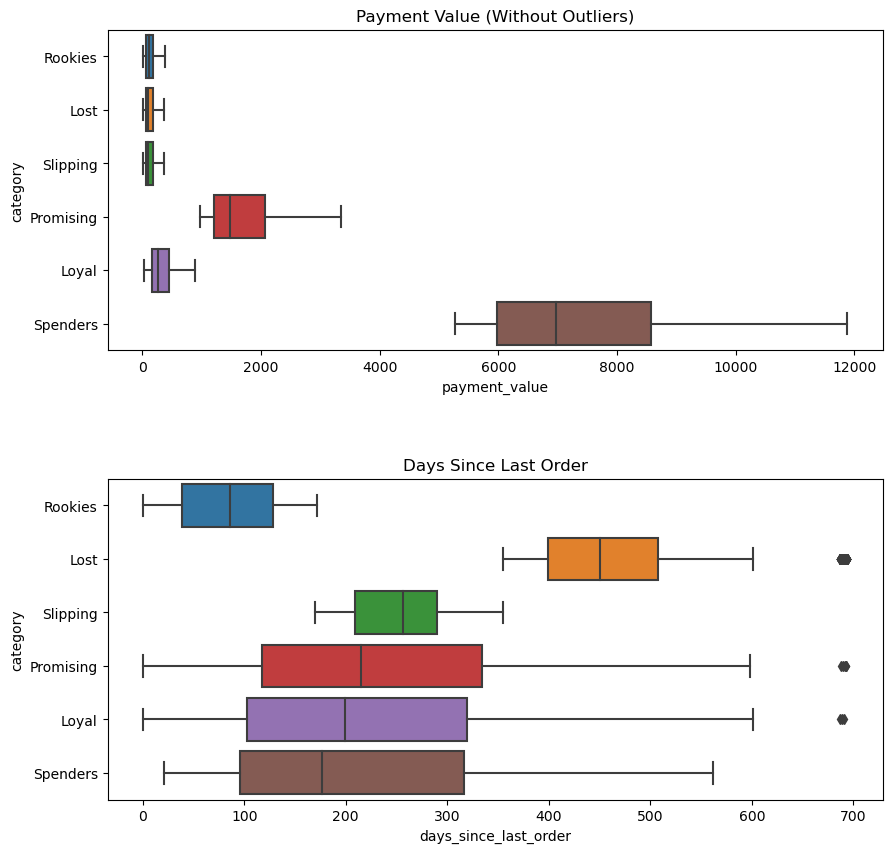

In [19]:
fig, axes = plt.subplots(2, 1, figsize=(10, 10), gridspec_kw={'hspace': 0.4})

# Box plot for 'payment_value' ignoring outliers
sns.boxplot(y='category', x='payment_value', data=RFM, ax=axes[0], showfliers=False)
axes[0].set_title('Payment Value (Without Outliers)')

# Box plot for 'days_since_last_order'
sns.boxplot(y='category', x='days_since_last_order', data=RFM, ax=axes[1])
axes[1].set_title('Days Since Last Order')


plt.show()


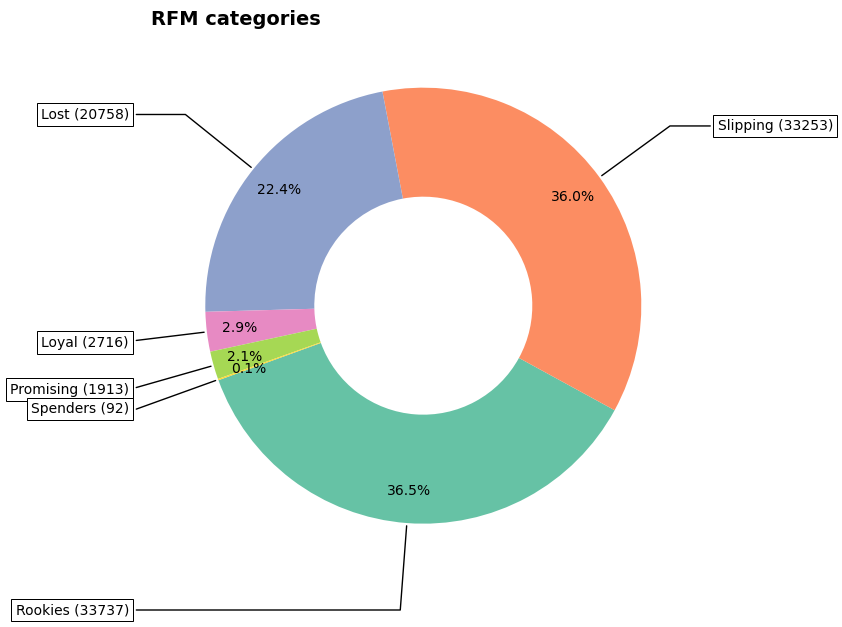

In [20]:
fig, ax = plt.subplots(figsize=(12, 5), subplot_kw=dict(aspect="equal"))

wedges, texts, autotexts = ax.pie(category_counts, autopct='%1.1f%%', pctdistance=0.85, wedgeprops=dict(width=0.5), startangle=200, colors=plt.cm.Set2.colors)

bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
kw = dict(arrowprops=dict(arrowstyle="-"),
          bbox=bbox_props, zorder=0, va="center")

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = f"angle,angleA=0,angleB={ang}"
    kw["arrowprops"].update({"connectionstyle": connectionstyle})
    ax.annotate(f"{category_counts.index[i]} ({category_counts.values[i]})", xy=(x, y), xytext=(1.35*np.sign(x), 1.4*y),
                horizontalalignment=horizontalalignment, **kw)

ax.set_title("RFM categories", loc='left', fontsize=14, fontweight='bold')
plt.subplots_adjust(top=1.2)
plt.show()


# Comparaisons

In [21]:
def ARI_calc(data_to_predict, data_to_train, n_clusters=6, random_state=42):
    
    """
    Pour calculer l'ARI entre des prédictions et des labels réels.

    Paramètress:
    - data_to_predict: DataFrame avec les données à prédire.
    - data_to_train: DataFrame  avec les données d'entraînement.
    - n_clusters: Nb de clusters pour le KMeans (6 par défaut).
    - random_state : 42 par défaut.

    Retourne:
    - ARI: Adjusted Rand Index score.
    """

    
    """
    On établit la baseline pour la comparaison
    """
    
    X = data_to_predict.values
    X_scaled = scaler.fit_transform(X)
    
    kmeans = KMeans(n_clusters=n_clusters, n_init='auto', random_state=random_state)
    kmeans.fit(X_scaled)
    
    labels_true = kmeans.labels_
    
    
    """
    On prédit
    """
    
    X_train = data_to_train.values
    X_train_scaled = scaler.fit_transform(X_train)
    
    # training kmeans on data_to_train
    kmeans = KMeans(n_clusters=n_clusters, n_init='auto', random_state=random_state)
    kmeans.fit(X_train_scaled)
    
    # predicting on data_to_predict
    X_predict = data_to_predict.values
    X_predict_scaled = scaler.fit_transform(X_predict)
    labels_pred = kmeans.predict(X_predict_scaled)
    
    ARI = adjusted_rand_score(labels_true, labels_pred)
    
    return ARI

In [22]:
# time periods
periods = list(range(6, 24))

# creating results dataframe
ari_results = pd.DataFrame(columns=['Month', 'ARI'])



# loop to create one dataframe per time period
for period in periods:
    data_period = data_m[data_m['months_count'] < period].copy()

    RFM_period = data_period.groupby('customer_unique_id').agg({
        'order_purchase_timestamp': 'max',
        'order_id': 'nunique',
        'payment_value': 'sum'
    })

    RFM_period.columns = ['last_order_dt', 'nb_orders', 'payment_value']

    RFM_period['days_since_last_order'] = (RFM_period['last_order_dt'].max() - RFM_period['last_order_dt']).dt.days

    RFM_period.drop(columns=['last_order_dt'], inplace=True)
    
    # Renaming dataframe according to corresponding period
    globals()[f"data_{period}"] = data_period
    globals()[f"RFM_{period}"] = RFM_period
    
    print(f"RFM_{period} created")



# compute ARI between periods
for period in periods:
    
    # ARI : RFM_period vs RFM_6
    ari_value = ARI_calc(locals()[f'RFM_{period}'], RFM_6)
    ari_value = round(ari_value, 2)
    
    iteration_results = pd.DataFrame({'Month': [period],
                                      'ARI': [ari_value]})
    ari_results = pd.concat([ari_results, iteration_results], ignore_index=True)


display(ari_results)

RFM_6 created
RFM_7 created
RFM_8 created
RFM_9 created
RFM_10 created
RFM_11 created
RFM_12 created
RFM_13 created
RFM_14 created
RFM_15 created
RFM_16 created
RFM_17 created
RFM_18 created
RFM_19 created
RFM_20 created
RFM_21 created
RFM_22 created
RFM_23 created


,Month,ARI
0,6,1.00
1,7,0.85
2,8,0.83
3,9,0.82
4,10,0.44
5,11,0.53
6,12,0.57
7,13,0.54
8,14,0.52
9,15,0.66


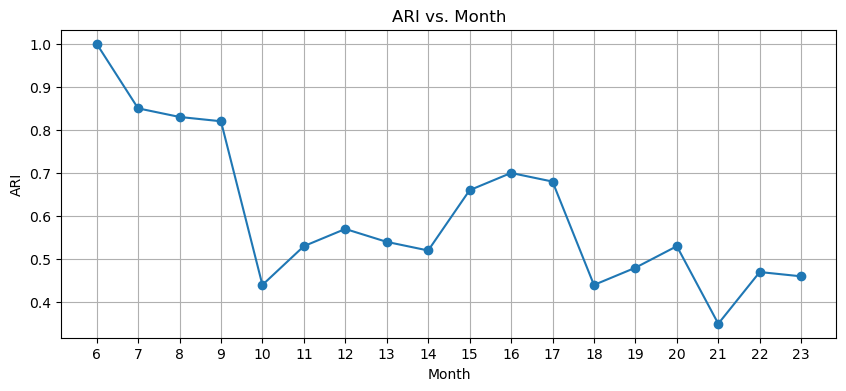

In [23]:
plt.figure(figsize=(10, 4))
plt.plot(ari_results['Month'], ari_results['ARI'], marker='o', linestyle='-')
plt.title('ARI vs. Month')
plt.xlabel('Month')
plt.ylabel('ARI')
plt.grid(True)
plt.xticks(periods)  # Set x-axis ticks to months
plt.show()

# Actualisation trimestrielle

In [24]:
ari_results_trimestre = pd.DataFrame(columns=['Month', 'ARI'])

In [25]:
# Separating periods in quarters
T1 = [6,7,8]
T2 = [9,10,11]
T3 = [12,13,14]
T4 = [15,16,17]
T5 = [18,19,20]
T6 = [21,22,23]

for trimestre in [T1, T2, T3, T4, T5, T6] :

    for period in trimestre:

        # ARI : RFM_period vs RFM_start_of_quarter
        ari_value = ARI_calc(locals()[f'RFM_{period}'], locals()[f'RFM_{trimestre[0]}'])
        ari_value = round(ari_value, 2)

        iteration_results = pd.DataFrame({'Month': [period],
                                          'ARI': [ari_value]})
        ari_results_trimestre = pd.concat([ari_results_trimestre, iteration_results], ignore_index=True)


display(ari_results_trimestre)

,Month,ARI
0,6,1.00
1,7,0.85
2,8,0.83
3,9,1.00
4,10,0.41
5,11,0.48
6,12,1.00
7,13,0.98
8,14,0.92
9,15,1.00


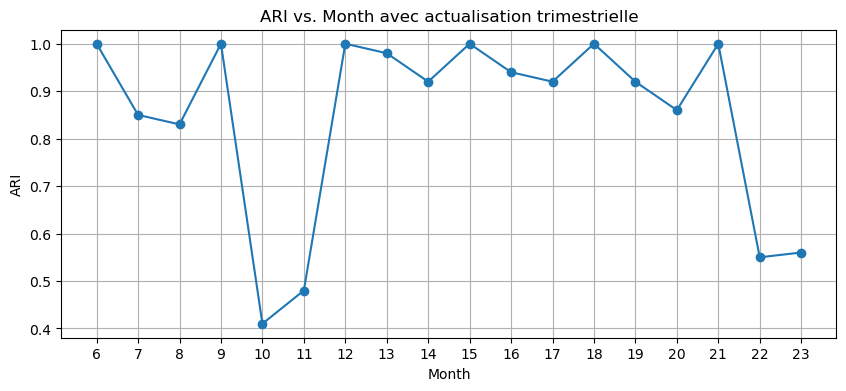

In [26]:
plt.figure(figsize=(10, 4))
plt.plot(ari_results_trimestre['Month'], ari_results_trimestre['ARI'], marker='o', linestyle='-')
plt.title('ARI vs. Month avec actualisation trimestrielle')
plt.xlabel('Month')
plt.ylabel('ARI')
plt.grid(True)
plt.xticks(periods)  
plt.show()

# Actualisation semestrielle

In [27]:
ari_results_semestre = pd.DataFrame(columns=['Month', 'ARI'])

In [28]:
# Separating periods into semesters

S1 = [6,7,8,9,10,11]
S2 = [12,13,14,15,16,17]
S3 = [18,19,20,21,22,23]

for semestre in [S1, S2, S3] :

    for period in semestre:

        # ARI : RFM_period vs RFM_start_of_semester
        ari_value = ARI_calc(locals()[f'RFM_{period}'], locals()[f'RFM_{semestre[0]}'])
        ari_value = round(ari_value, 2)

        iteration_results = pd.DataFrame({'Month': [period],
                                          'ARI': [ari_value]})
        ari_results_semestre = pd.concat([ari_results_semestre, iteration_results], ignore_index=True)


display(ari_results_semestre)

,Month,ARI
0,6,1.00
1,7,0.85
2,8,0.83
3,9,0.82
4,10,0.44
5,11,0.53
6,12,1.00
7,13,0.98
8,14,0.92
9,15,0.51


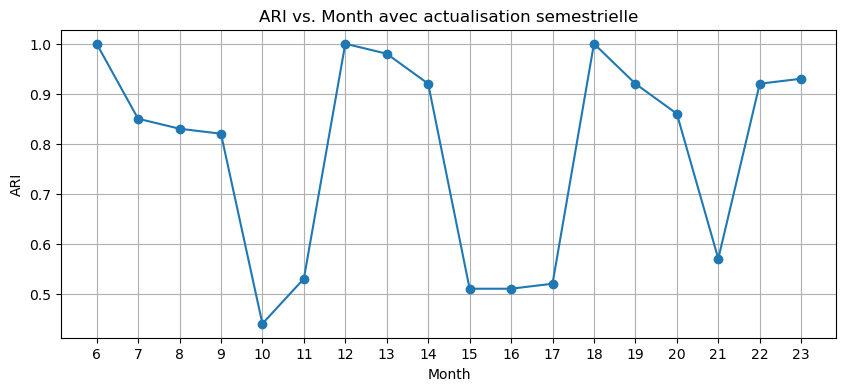

In [29]:
plt.figure(figsize=(10, 4))
plt.plot(ari_results_semestre['Month'], ari_results_semestre['ARI'], marker='o', linestyle='-')
plt.title('ARI vs. Month avec actualisation semestrielle')
plt.xlabel('Month')
plt.ylabel('ARI')
plt.grid(True)
plt.xticks(periods) 
plt.show()

Actualisation trimestrielle paraît être plutôt correcte.

Cependant, on a un drop au mois 10, qui correspond au mois étrange que l'on avait remarqué.  
Dès lors, on pourrait recomander une actualisation trimestrielle, ou tous les 4 mois, avec une actualisation de plus en cas de mois vraiment différent des autres (volume de ventes, valeur, nombre de clients, etc)  
On pourrait même imaginer calculer un indicateur de similitude entre le mois n et le mois n-1; ou entre le mois n et le mois de référence, et ne réactualiser le modèle que lorsque cet indicateur indique un changement.